In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime
from matplotlib import ticker
from sklearn import linear_model
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

import graphviz

from sklearn.model_selection import train_test_split
# !pip install mlxtend --upgrade
from mlxtend.evaluate import bias_variance_decomp

from geopy.geocoders import GoogleV3

%matplotlib inline

In [2]:
def parse_arrival_time(arrival_time, doj, year='2019'):
    """This function takes in the arrival_time variable as a string from the dataset as HH:MM time, and the date of journey and returns a datetime object.
    arrival_time: string
    doj: datetime object
    """

    arr_time = arrival_time.split(' ')

    if len(arr_time) > 1:
        time = arr_time[0]
        day = arr_time[1]
        mon = arr_time[2]

    else:
        time = arrival_time
        day = doj.strftime('%d')
        mon = doj.strftime('%b')
        year = doj.strftime('%Y')

    dt_string = '{}-{}-{} {}'.format(year, mon, day, time)
    dt_object = datetime.strptime(dt_string, '%Y-%b-%d %H:%M')

    return dt_object


In [3]:
def parse_departure_time(doj, dep_time):
    day = doj.strftime('%d')
    mon = doj.strftime('%b')
    year = doj.strftime('%Y')

    dt_string = '{}-{}-{} {}'.format(year, mon, day, dep_time)
    dt_object = datetime.strptime(dt_string, '%Y-%b-%d %H:%M')

    return dt_object


In [4]:
# load csv
df = pd.read_csv('Airline Ticket Prices.csv', parse_dates=[
                 'Date_of_Journey'], dayfirst=True)

df['DT_Arrival_Time'] = df.apply(lambda df: parse_arrival_time(
    df['Arrival_Time'], df['Date_of_Journey']), axis=1)

df['DT_Departure_Time'] = df.apply(lambda df: parse_departure_time(
    df['Date_of_Journey'], df['Dep_Time']), axis=1)

df['DT_Duration'] = df['DT_Arrival_Time'] - df['DT_Departure_Time']

# df['DT_Duration_Float'] = df['DT_Duration'] / np.timedelta64(1, 'h')

# EDA

In [5]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR ? DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,2019-03-22 01:10:00,2019-03-24 22:20:00,-3 days +02:50:00
1,Air India,2019-05-01,Kolkata,Banglore,CCU ? IXR ? BBI ? BLR,05:50,13:15,7h 25m,2 stops,No info,7662,2019-05-01 13:15:00,2019-05-01 05:50:00,0 days 07:25:00
2,Jet Airways,2019-06-09,Delhi,Cochin,DEL ? LKO ? BOM ? COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,2019-06-10 04:25:00,2019-06-09 09:25:00,0 days 19:00:00
3,IndiGo,2019-05-12,Kolkata,Banglore,CCU ? NAG ? BLR,18:05,23:30,5h 25m,1 stop,No info,6218,2019-05-12 23:30:00,2019-05-12 18:05:00,0 days 05:25:00
4,IndiGo,2019-03-01,Banglore,New Delhi,BLR ? NAG ? DEL,16:50,21:35,4h 45m,1 stop,No info,13302,2019-03-01 21:35:00,2019-03-01 16:50:00,0 days 04:45:00


## Data Cleanup

In [6]:
# split negative duration flights into a new dataframe
df_negative_duration = df[(df.DT_Duration < pd.Timedelta(days=0))]
df_negative_duration

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR ? DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,2019-03-22 01:10:00,2019-03-24 22:20:00,-3 days +02:50:00
21,Air India,2019-03-21,Banglore,New Delhi,BLR ? COK ? DEL,22:00,13:20 19 Mar,15h 20m,1 stop,No info,6955,2019-03-19 13:20:00,2019-03-21 22:00:00,-3 days +15:20:00
110,Jet Airways,2019-03-18,Banglore,New Delhi,BLR ? BOM ? DEL,14:05,05:05 16 Mar,15h,1 stop,No info,13555,2019-03-16 05:05:00,2019-03-18 14:05:00,-3 days +15:00:00
379,Jet Airways,2019-03-18,Banglore,New Delhi,BLR ? BOM ? DEL,16:55,09:00 16 Mar,16h 5m,1 stop,In-flight meal not included,11087,2019-03-16 09:00:00,2019-03-18 16:55:00,-3 days +16:05:00
605,Air India,2019-03-21,Banglore,New Delhi,BLR ? COK ? DEL,22:00,10:50 19 Mar,12h 50m,1 stop,No info,6955,2019-03-19 10:50:00,2019-03-21 22:00:00,-3 days +12:50:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10441,Jet Airways,2019-03-18,Banglore,New Delhi,BLR ? BOM ? DEL,11:40,08:15 16 Mar,20h 35m,1 stop,No info,12284,2019-03-16 08:15:00,2019-03-18 11:40:00,-3 days +20:35:00
10489,IndiGo,2019-03-15,Chennai,Kolkata,MAA ? CCU,22:05,00:30 13 Mar,2h 25m,non-stop,No info,6297,2019-03-13 00:30:00,2019-03-15 22:05:00,-3 days +02:25:00
10590,Air Asia,2019-03-24,Banglore,New Delhi,BLR ? DEL,23:25,02:10 22 Mar,2h 45m,non-stop,No info,3383,2019-03-22 02:10:00,2019-03-24 23:25:00,-3 days +02:45:00
10638,Jet Airways,2019-03-21,Banglore,New Delhi,BLR ? BOM ? DEL,21:25,11:25 19 Mar,14h,1 stop,In-flight meal not included,7832,2019-03-19 11:25:00,2019-03-21 21:25:00,-3 days +14:00:00


In [7]:
# remove negative duration flights
df = df[df.DT_Duration > pd.Timedelta(days=0)].reset_index()
df.drop(labels='index', axis=1, inplace=True)
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
0,Air India,2019-05-01,Kolkata,Banglore,CCU ? IXR ? BBI ? BLR,05:50,13:15,7h 25m,2 stops,No info,7662,2019-05-01 13:15:00,2019-05-01 05:50:00,0 days 07:25:00
1,Jet Airways,2019-06-09,Delhi,Cochin,DEL ? LKO ? BOM ? COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,2019-06-10 04:25:00,2019-06-09 09:25:00,0 days 19:00:00
2,IndiGo,2019-05-12,Kolkata,Banglore,CCU ? NAG ? BLR,18:05,23:30,5h 25m,1 stop,No info,6218,2019-05-12 23:30:00,2019-05-12 18:05:00,0 days 05:25:00
3,IndiGo,2019-03-01,Banglore,New Delhi,BLR ? NAG ? DEL,16:50,21:35,4h 45m,1 stop,No info,13302,2019-03-01 21:35:00,2019-03-01 16:50:00,0 days 04:45:00
4,SpiceJet,2019-06-24,Kolkata,Banglore,CCU ? BLR,09:00,11:25,2h 25m,non-stop,No info,3873,2019-06-24 11:25:00,2019-06-24 09:00:00,0 days 02:25:00


## 4 days trips analysis

In [8]:
# number of flights that spanned over 4 days
print(len(df[df.DT_Duration > pd.Timedelta(days=4)]), 'trips.')
df[df.DT_Duration > pd.Timedelta(days=4)].head()

22 trips.


,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
69,Jet Airways,2019-03-09,Banglore,New Delhi,BLR ? BOM ? DEL,05:45,08:15 13 Mar,26h 30m,1 stop,In-flight meal not included,9134,2019-03-13 08:15:00,2019-03-09 05:45:00,4 days 02:30:00
985,Air India,2019-03-03,Banglore,New Delhi,BLR ? CCU ? GAU ? DEL,11:05,22:10 07 Mar,35h 5m,2 stops,No info,11791,2019-03-07 22:10:00,2019-03-03 11:05:00,4 days 11:05:00
1511,Jet Airways,2019-03-09,Banglore,New Delhi,BLR ? BOM ? DEL,08:55,10:45 13 Mar,25h 50m,1 stop,In-flight meal not included,11087,2019-03-13 10:45:00,2019-03-09 08:55:00,4 days 01:50:00
1731,Air India,2019-03-09,Banglore,New Delhi,BLR ? HYD ? DEL,06:50,08:50 13 Mar,26h,1 stop,No info,5626,2019-03-13 08:50:00,2019-03-09 06:50:00,4 days 02:00:00
2504,Jet Airways,2019-03-09,Banglore,New Delhi,BLR ? BOM ? DEL,08:00,09:30 13 Mar,25h 30m,1 stop,In-flight meal not included,11087,2019-03-13 09:30:00,2019-03-09 08:00:00,4 days 01:30:00


## Airlines, Originations, and Destinations Analysis

In [9]:
df['Airline'].value_counts()

Jet Airways                          3788
IndiGo                               2048
Air India                            1730
Multiple carriers                    1196
SpiceJet                              817
Vistara                               477
Air Asia                              318
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

In [10]:
df['Source'].value_counts()

Delhi       4537
Kolkata     2871
Banglore    2110
Mumbai       693
Chennai      380
Name: Source, dtype: int64

In [11]:
df['Destination'].value_counts()

Cochin       4537
Banglore     2871
Delhi        1265
New Delhi     845
Hyderabad     693
Kolkata       380
Name: Destination, dtype: int64

In [12]:
print(len(df[(df['Total_Stops'] == 'non-stop')]))
print(len(df[(df['Total_Stops'] == '1 stop')]))
print(len(df[(df['Total_Stops'] == '2 stops')]))
print(len(df[(df['Total_Stops'] == '3 stops')]))
print(len(df[(df['Total_Stops'] == '4 stops')]))
print(len(df[(df['Additional_Info'] == 'Red-eye flight')]))

3483
5555
1506
45
1
1


## Observations
Following are our observations with regards to the data at hand:
- Total number of records = 10,683
- Total number of negative duration flights = 92
- Number of unique airlines = 12
    - Jet Airways flew the highest number of trips (3,788)
    - Trujet flew only a single trip
- Number of unique originations = 5
    - Delhi the highest origination at 4,537 trips
    - Chennai the lowest origination at 380 trips
- Number of unique destinations = 6
    - Cochin the highest destination at 4,537 trips
    - Kolkata the lowest destination at 380 trips
- Number of unique routes = 128
- Flights data between 2019-03-01 and 2019-06-27 (almost 4 months in total)
- Average price per ticket = 9,087 Rs
    - Cheapest ticket = 1,759 Rs
    - Most expensive ticket = 79,512 Rs
- Average flight duration = 11:01:28 hrs (after removing the negative duration flights)
- Longest duration was 4 days 16:20 hrs (total of 22 flights exceeded 4 days)
- There is only one flight that's missing some data
- Number of:
    - Direct flights = 3,483
    - 1 stop flights = 5,555
    - 2 stop flights = 1,506
    - 3+ stop flights = 46
    - Red-eye flights = 1

In [13]:
df.describe(include='all', datetime_is_numeric=True)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
count,10591,10591,10591,10591,10590,10591,10591,10591,10590,10591,10591.000000,10591,10591,10591
unique,12,NaN,5,6,128,222,1310,367,5,10,NaN,NaN,NaN,NaN
top,Jet Airways,NaN,Delhi,Cochin,DEL ? BOM ? COK,18:55,19:00,2h 50m,1 stop,No info,NaN,NaN,NaN,NaN
freq,3788,NaN,4537,4537,2376,232,423,548,5555,8291,NaN,NaN,NaN,NaN
mean,NaN,2019-05-05 05:40:59.937682944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9067.230856,2019-05-06 05:34:25.045793280,2019-05-05 18:32:56.697195776,0 days 11:01:28.348597866
min,NaN,2019-03-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1759.000000,2019-03-01 04:00:00,2019-03-01 00:20:00,0 days 00:05:00
25%,NaN,2019-04-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5228.000000,2019-04-01 08:40:00,2019-04-01 05:57:30,0 days 02:50:00
50%,NaN,2019-05-15 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8372.000000,2019-05-15 21:40:00,2019-05-15 11:30:00,0 days 08:35:00
75%,NaN,2019-06-06 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12373.000000,2019-06-06 17:35:00,2019-06-06 07:10:00,0 days 15:30:00
max,NaN,2019-06-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79512.000000,2019-06-29 04:25:00,2019-06-27 23:55:00,4 days 16:20:00


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10591 entries, 0 to 10590
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   Airline            10591 non-null  object         
 1   Date_of_Journey    10591 non-null  datetime64[ns] 
 2   Source             10591 non-null  object         
 3   Destination        10591 non-null  object         
 4   Route              10590 non-null  object         
 5   Dep_Time           10591 non-null  object         
 6   Arrival_Time       10591 non-null  object         
 7   Duration           10591 non-null  object         
 8   Total_Stops        10590 non-null  object         
 9   Additional_Info    10591 non-null  object         
 10  Price              10591 non-null  int64          
 11  DT_Arrival_Time    10591 non-null  datetime64[ns] 
 12  DT_Departure_Time  10591 non-null  datetime64[ns] 
 13  DT_Duration        10591 non-null  timedelta64

In [15]:
df[df.isna().any(axis=1)]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
8967,Air India,2019-05-06,Delhi,Cochin,NaN,09:45,09:25 07 May,23h 40m,NaN,No info,7480,2019-05-07 09:25:00,2019-05-06 09:45:00,0 days 23:40:00


## Data Visualization

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
0,1,1556668800000000000,3,0,84,05:50,13:15,7h 25m,1,8,7662,1556716500000000000,1556689800000000000,26700000000000
1,4,1560038400000000000,2,1,118,09:25,04:25 10 Jun,19h,1,8,13882,1560140700000000000,1560072300000000000,68400000000000
2,3,1557619200000000000,3,0,91,18:05,23:30,5h 25m,0,8,6218,1557703800000000000,1557684300000000000,19500000000000
3,3,1551398400000000000,0,5,29,16:50,21:35,4h 45m,0,8,13302,1551476100000000000,1551459000000000000,17100000000000
4,8,1561334400000000000,3,0,64,09:00,11:25,2h 25m,4,8,3873,1561375500000000000,1561366800000000000,8700000000000


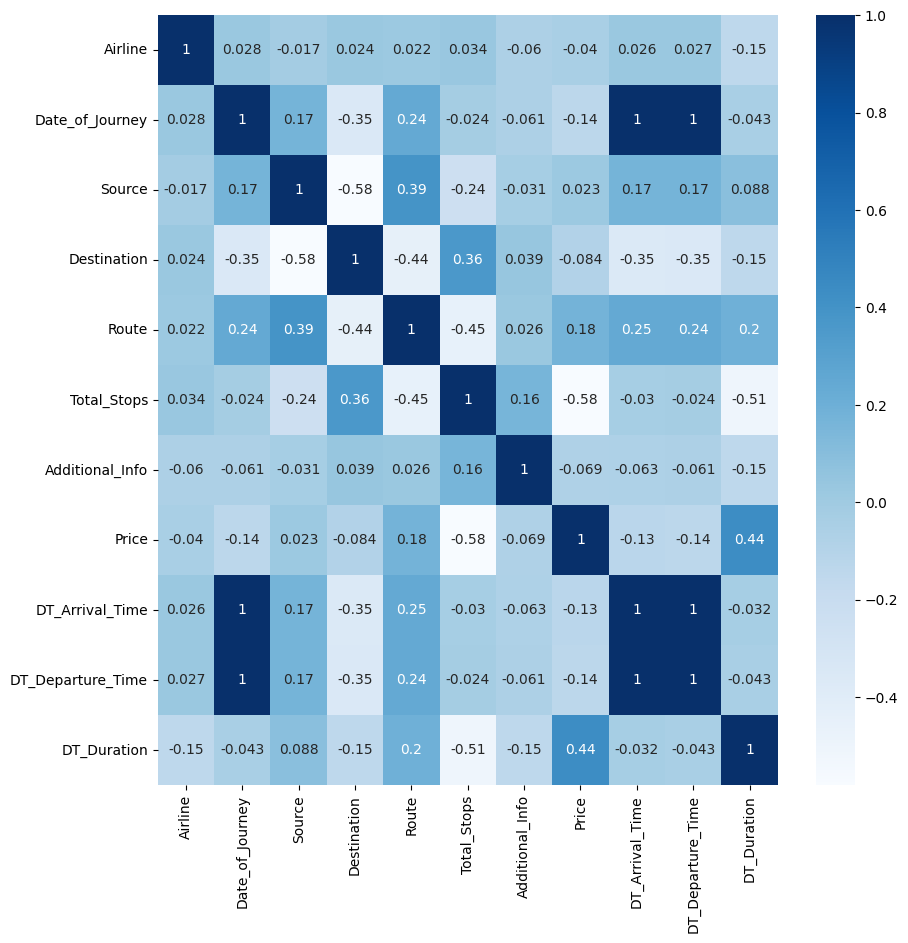

In [16]:
# create a new dataframe so that the dates can be used in the correlation heatmap
df_corr = df.copy(deep=True)

# datetime columns
columns = ['Date_of_Journey',  'DT_Arrival_Time',
           'DT_Departure_Time', 'DT_Duration']

for col in columns:
    df_corr[col] = pd.to_numeric(df_corr[col])

le = LabelEncoder()
df_corr[['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Additional_Info']] = df_corr[[
    'Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Additional_Info']].apply(le.fit_transform)

fig, axes = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(df_corr.corr(numeric_only=True), cmap="Blues", annot=True)

df_corr.head()


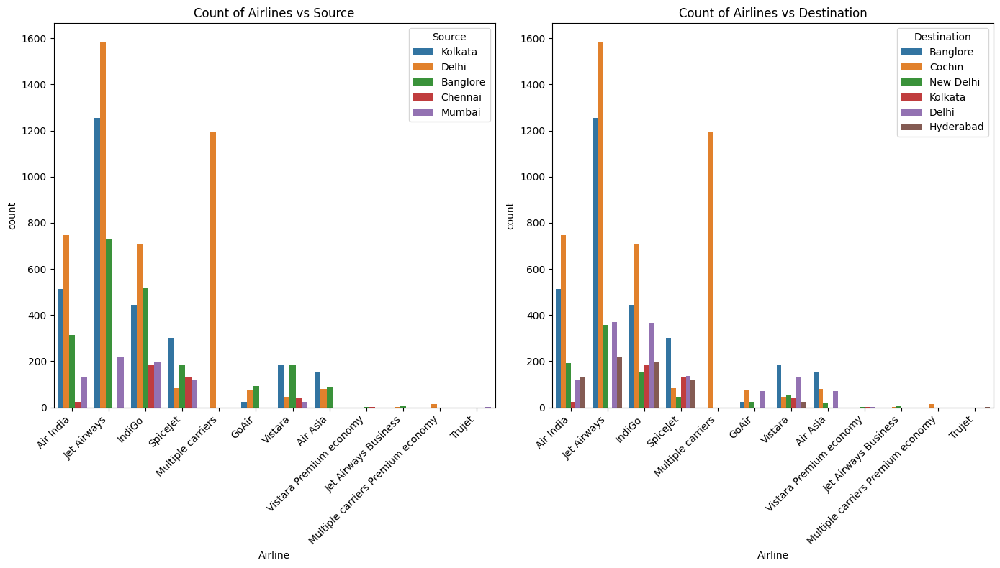

In [17]:
# number of airlines vs source and destination
fig, axes = plt.subplots(1, 2, figsize=(14,8))
ax = sns.countplot(data=df, x=df['Airline'], hue=df['Source'], ax=axes[0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('Count of Airlines vs Source')
ax = sns.countplot(data=df, x=df['Airline'], hue=df['Destination'], ax=axes[1])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('Count of Airlines vs Destination')
plt.tight_layout()
plt.show()

In [18]:
# df.groupby(by='Airline', as_index=False).mean().sort_values(by='Price', ascending=False)
df.DT_Duration.head() / np.timedelta64(1, 'h')  # convert datetime to hours
df.groupby(['Source', 'Destination']).mean()

/var/folders/7n/_2mtj9_n18936qksyr5qs1zw0000gn/T/ipykernel_5495/2702723405.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby(['Source', 'Destination']).mean()


Price
Source   Destination              
Banglore Delhi         5143.918577
         New Delhi    11970.147929
Chennai  Kolkata       4785.926316
Delhi    Cochin       10539.439057
Kolkata  Banglore      9158.389411
Mumbai   Hyderabad     5020.760462

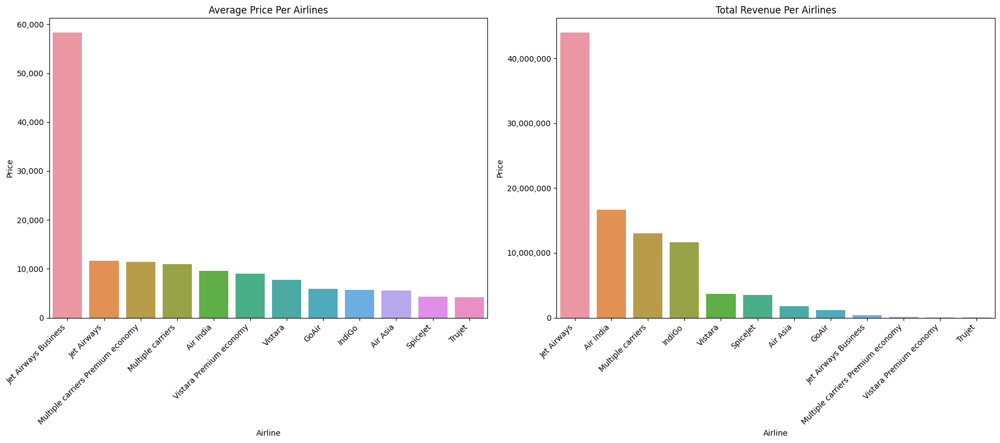

In [19]:
# average cost and revenue per airline
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax = sns.barplot(data=df.groupby(by='Airline', as_index=False).mean(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Airline', y='Price', ax=axes[0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Average Price Per Airlines')
ax = sns.barplot(data=df.groupby(by='Airline', as_index=False).sum(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Airline', y='Price', ax=axes[1])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Total Revenue Per Airlines')
plt.tight_layout()
plt.show()


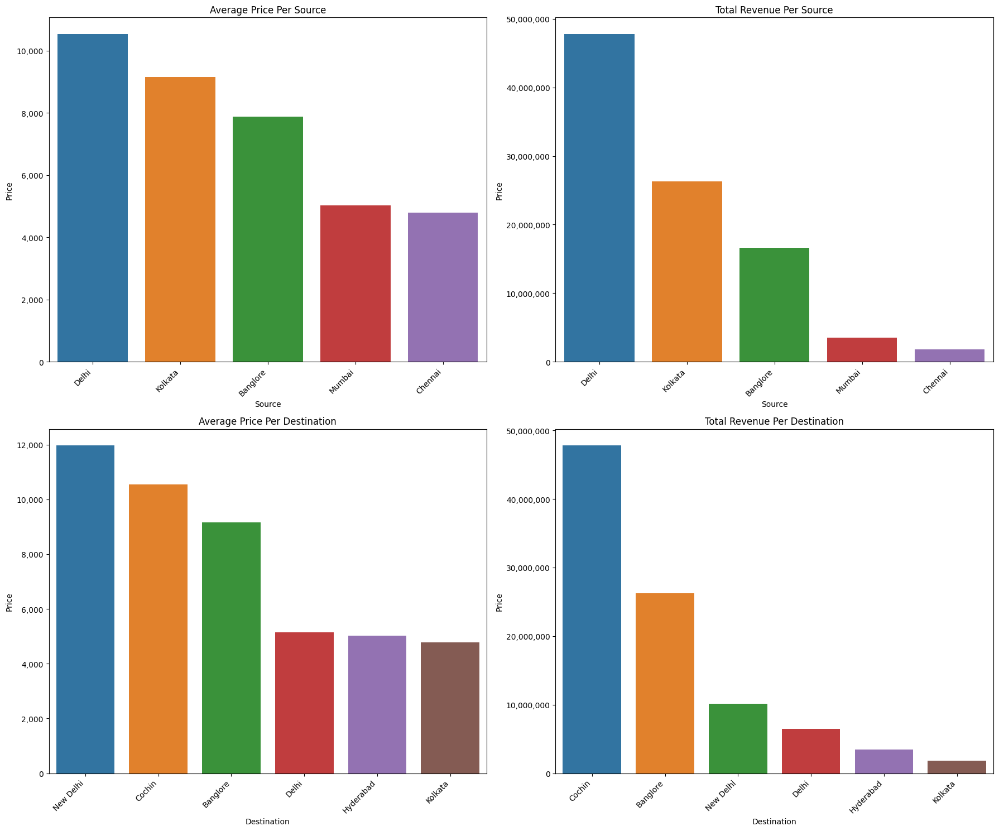

In [20]:
# average cost per source or destination
fig, axes = plt.subplots(2, 2, figsize=(18, 15))
ax = sns.barplot(data=df.groupby(by='Source', as_index=False).mean(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Source', y='Price', ax=axes[0][0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Average Price Per Source')
ax = sns.barplot(data=df.groupby(by='Source', as_index=False).sum(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Source', y='Price', ax=axes[0][1])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Total Revenue Per Source')
ax = sns.barplot(data=df.groupby(by='Destination', as_index=False).mean(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Destination', y='Price', ax=axes[1][0])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Average Price Per Destination')
ax = sns.barplot(data=df.groupby(by='Destination', as_index=False).sum(
    numeric_only=True).sort_values(by='Price', ascending=False), x='Destination', y='Price', ax=axes[1][1])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.set_title('Total Revenue Per Destination')
plt.tight_layout()
plt.show()


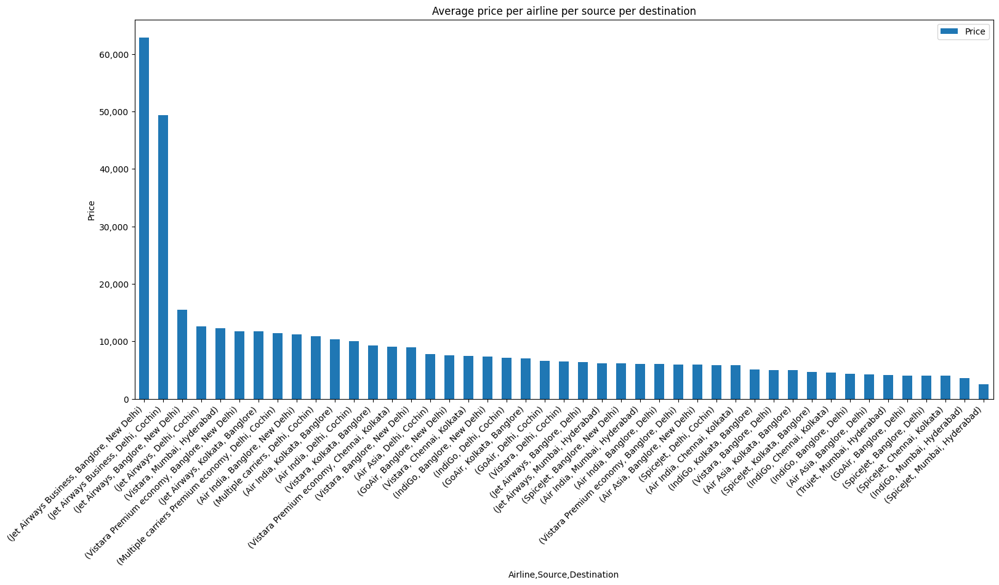

In [21]:
# average price per airline per source per destination
ax = df.groupby(['Airline', 'Source', 'Destination'], as_index=True).mean(numeric_only=True).sort_values(
    by='Price', ascending=False).plot.bar(figsize=(18, 8))
ax.set_title('Average price per airline per source per destination')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Price')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
plt.show()


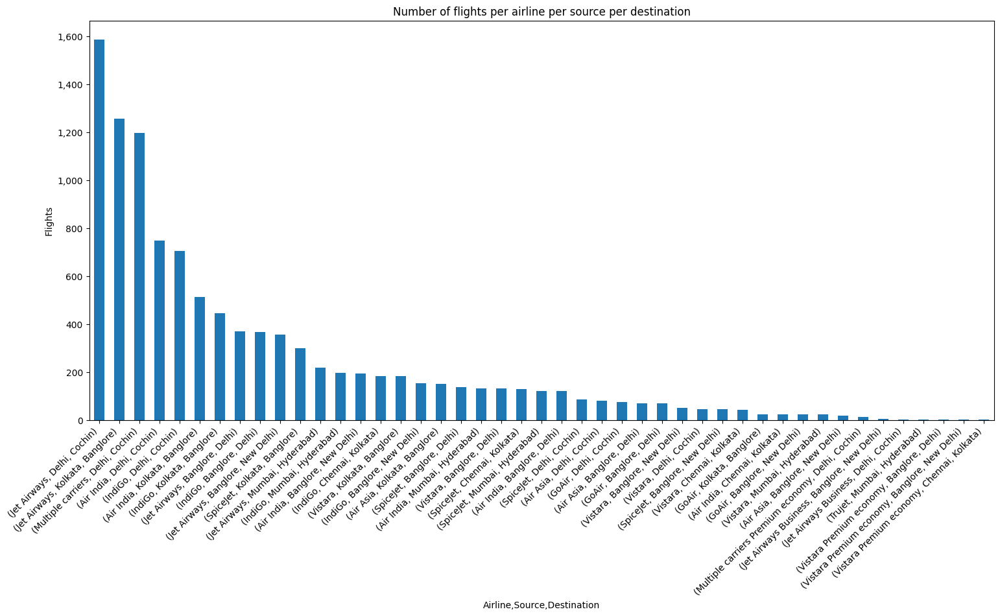

In [22]:
# number of flights per airline per source per destination
fig, axes = plt.subplots(figsize=(18, 8))
ax = df.groupby(['Airline', 'Source', 'Destination'], as_index=True).size().sort_values(ascending=False).plot.bar()
ax.set_title('Number of flights per airline per source per destination')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Flights')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
plt.show()

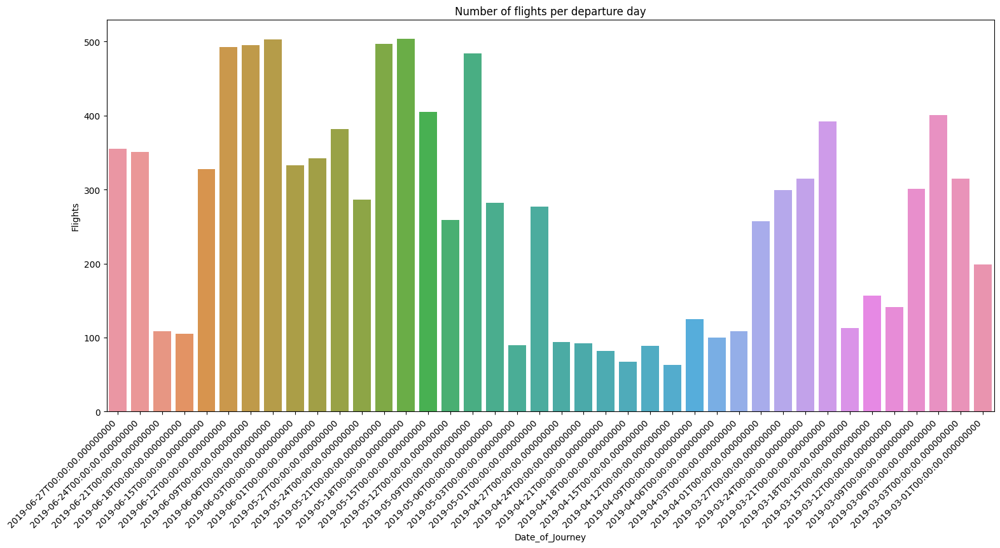

In [23]:
# number of flights per departure day
fig, axes = plt.subplots(figsize=(18, 8))
# ax = df.groupby(['Date_of_Journey'], as_index=False).size().sort_values(by='Date_of_Journey', ascending=True).plot.bar()
ax = sns.barplot(data=df.groupby('Date_of_Journey', as_index=False).size().sort_values(
    by='Date_of_Journey', ascending=False), x='Date_of_Journey', y='size')
ax.set_title('Number of flights per departure day')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Flights')
plt.show()


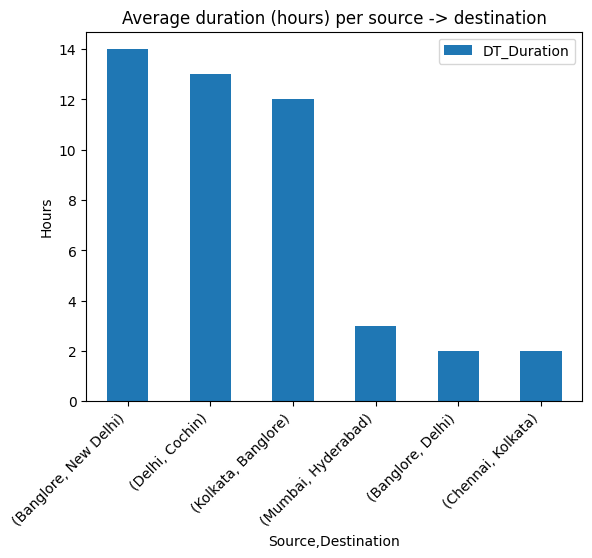

In [24]:
# average duration per source -> destination
ax = df[['Source', 'Destination', 'DT_Duration']].groupby(['Source', 'Destination'], as_index=True).mean(
).sort_values(by='DT_Duration', ascending=False).astype('timedelta64[h]').plot.bar()
ax.set_title('Average duration (hours) per source -> destination')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Hours')
plt.show()


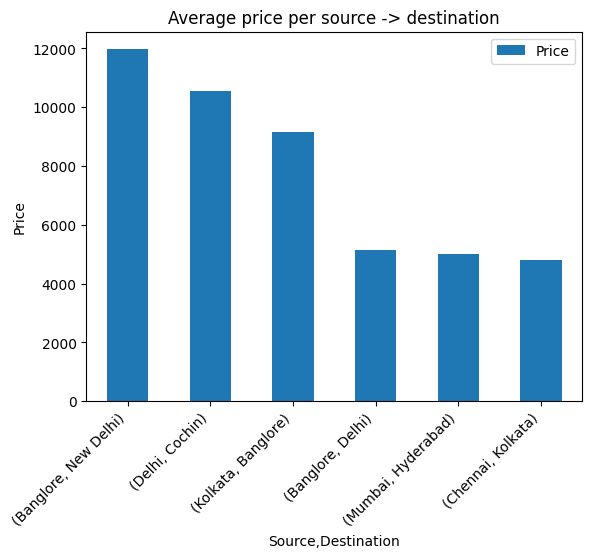

In [25]:
# average price per source -> destination
ax = df.groupby(['Source', 'Destination'], as_index=True).mean(
    numeric_only=True).sort_values(by='Price', ascending=False).plot.bar()
ax.set_title('Average price per source -> destination')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Price')
plt.show()


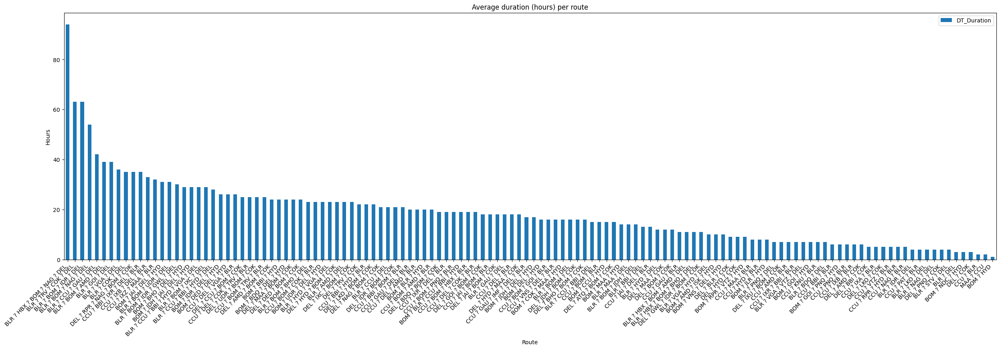

In [26]:
# average duration per route
ax = df[['Route', 'DT_Duration']].groupby(['Route'], as_index=True).mean(
).sort_values(by='DT_Duration', ascending=False).astype('timedelta64[h]').plot.bar(figsize=(30, 8))
ax.set_title('Average duration (hours) per route')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Hours')
plt.show()


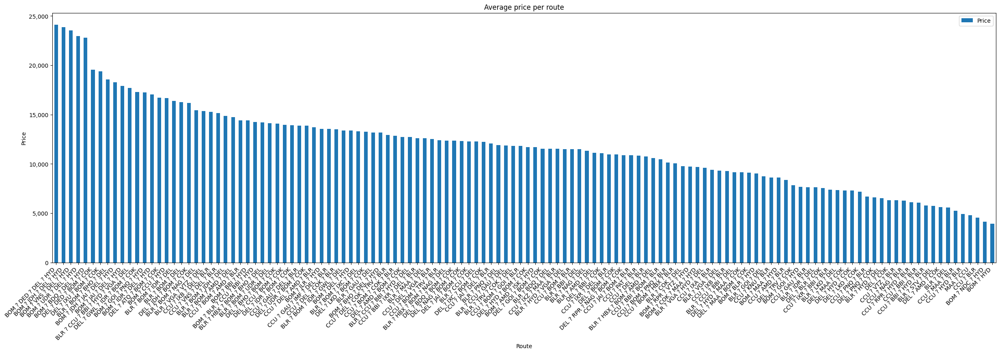

In [27]:
# average price per route
ax = df.groupby(['Route'], as_index=True).mean(numeric_only=True).sort_values(
    by='Price', ascending=False).plot.bar(figsize=(30, 8))
ax.set_title('Average price per route')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_ylabel('Price')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
plt.show()


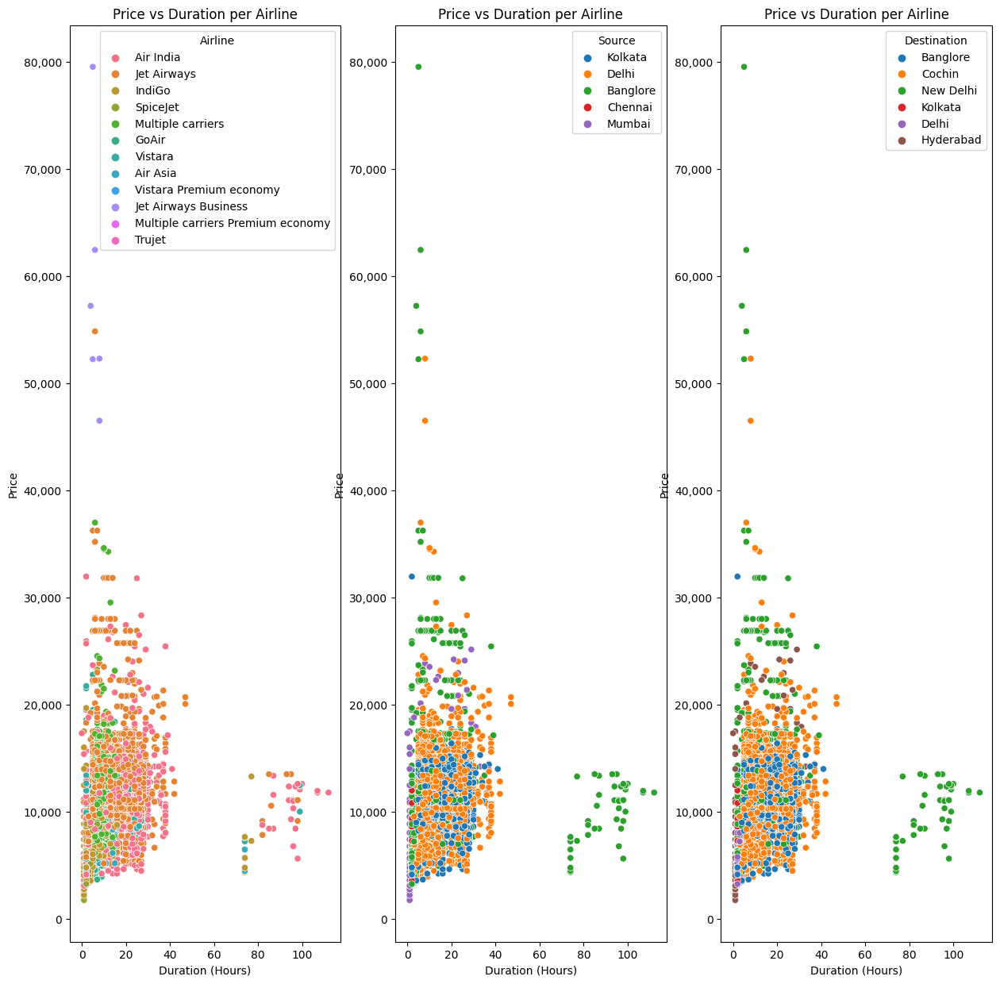

In [28]:
# price vs duration per airline/source/destination
fig, axes = plt.subplots(1, 3, figsize=(15, 15))
ax = ax = sns.scatterplot(data=df, x=df['DT_Duration'].astype(
    'timedelta64[h]'), y=df['Price'], hue=df['Airline'], ax=axes[0])
ax.set_title('Price vs Duration per Airline')
ax.set_xlabel('Duration (Hours)')
ax.set_ylabel('Price')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

ax = ax = sns.scatterplot(data=df, x=df['DT_Duration'].astype(
    'timedelta64[h]'), y=df['Price'], hue=df['Source'], ax=axes[1])
ax.set_title('Price vs Duration per Airline')
ax.set_xlabel('Duration (Hours)')
ax.set_ylabel('Price')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

ax = ax = sns.scatterplot(data=df, x=df['DT_Duration'].astype(
    'timedelta64[h]'), y=df['Price'], hue=df['Destination'], ax=axes[2])
ax.set_title('Price vs Duration per Airline')
ax.set_xlabel('Duration (Hours)')
ax.set_ylabel('Price')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
plt.show()


In [29]:
df[(df['Source'] == 'Banglore') & (df['Destination'] == 'New Delhi')
    & (df['DT_Duration'].astype('timedelta64[h]') > 60)].describe(include='all', datetime_is_numeric=True)


,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
count,52,52,52,52,52,52,52,52,52,52,52.000000,52,52,52
unique,5,NaN,1,1,15,28,41,33,4,2,NaN,NaN,NaN,NaN
top,Air India,NaN,Banglore,New Delhi,BLR ? BOM ? DEL,08:00,10:35 07 Mar,2h 50m,1 stop,No info,NaN,NaN,NaN,NaN
freq,21,NaN,52,52,14,4,4,5,28,38,NaN,NaN,NaN,NaN
mean,NaN,2019-03-07 21:41:32.307692288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9476.192308,2019-03-12 05:34:54.230769408,2019-03-08 12:03:10.384615424,3 days 17:31:43.846153846
min,NaN,2019-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4353.000000,2019-03-07 00:05:00,2019-03-03 05:45:00,3 days 02:45:00
25%,NaN,2019-03-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7270.000000,2019-03-07 10:35:00,2019-03-03 11:05:00,3 days 04:28:45
50%,NaN,2019-03-09 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10441.500000,2019-03-13 00:55:00,2019-03-09 07:30:00,3 days 22:22:30
75%,NaN,2019-03-09 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11830.250000,2019-03-13 10:25:00,2019-03-09 21:21:15,4 days 02:05:00
max,NaN,2019-03-24 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13502.000000,2019-03-28 02:20:00,2019-03-24 23:30:00,4 days 16:20:00


In [30]:
df[(df['Price'] > 40000)]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
651,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR ? BOM ? DEL,05:45,10:45,5h,1 stop,No info,52229,2019-03-01 10:45:00,2019-03-01 05:45:00,0 days 05:00:00
2901,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR ? BOM ? DEL,05:45,11:25,5h 40m,1 stop,Business class,79512,2019-03-01 11:25:00,2019-03-01 05:45:00,0 days 05:40:00
5325,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR ? BOM ? DEL,05:45,12:25,6h 40m,1 stop,Business class,62427,2019-03-01 12:25:00,2019-03-01 05:45:00,0 days 06:40:00
5391,Jet Airways,2019-03-01,Banglore,New Delhi,BLR ? BOM ? DEL,16:55,23:00,6h 5m,1 stop,No info,54826,2019-03-01 23:00:00,2019-03-01 16:55:00,0 days 06:05:00
7290,Jet Airways Business,2019-03-03,Delhi,Cochin,DEL ? ATQ ? BOM ? COK,20:05,04:25 04 Mar,8h 20m,2 stops,No info,46490,2019-03-04 04:25:00,2019-03-03 20:05:00,0 days 08:20:00
9637,Jet Airways Business,2019-03-06,Delhi,Cochin,DEL ? ATQ ? BOM ? COK,20:05,04:25 07 Mar,8h 20m,2 stops,No info,52285,2019-03-07 04:25:00,2019-03-06 20:05:00,0 days 08:20:00
10278,Jet Airways Business,2019-03-01,Banglore,New Delhi,BLR ? MAA ? DEL,09:45,14:25,4h 40m,1 stop,Business class,57209,2019-03-01 14:25:00,2019-03-01 09:45:00,0 days 04:40:00


# Regression

## Label Encoding

Before proceeding with the different regression models, we will proceed with some data adjustments that are necessary. Namely as follows:
1. Create a new dataframe called df_le where all categorical data are labeled
2. Maintain a proper mapping of all encoded data
3. Drop the original flight dates and times from the dataframe, as we already have datetime objects in the dataframe
4. Convert the datetime objects to numbers

A better method is to use OridnalEncoder to encode categorical features. Further details can be found here: https://scikit-learn.org/stable/modules/preprocessing.html#encoding-categorical-features

It's worth noting that LabelEncoder should only be used to encode predictin targets (y), furhter information can be found here: https://scikit-learn.org/stable/modules/preprocessing_targets.html#preprocessing-targets

In [31]:
# Label encode all categorical data
le = LabelEncoder()

# create a new label encoded dataframe
df_le = df.copy(deep=True)

# select the columns that contain strings
# columns = df_le.select_dtypes(include='object').columns.tolist()
columns = ['Airline', 'Source', 'Destination',
           'Route', 'Total_Stops', 'Additional_Info']
# print(columns)

# df_le[columns] = df_le[columns].apply(le.fit_transform)
# maintain the label-encoded mappings for future use
mappings = []
for col in columns:
    df_le[col] = le.fit_transform(df_le[col].values)
    mappings.append(dict(zip(le.classes_, range(len(le.classes_)))))


# print(mappings)
# print(le.classes_)

# drop original date and time columns
drop_cols = ['Date_of_Journey', 'Dep_Time', 'Arrival_Time', 'Duration']
df_le.drop(drop_cols, axis=1, inplace=True)


# datetime columns


# convert datetime to numeric for regression models
columns = ['DT_Arrival_Time', 'DT_Departure_Time', 'DT_Duration']
for col in columns:
    df_le[col] = pd.to_numeric(df_le[col])

df_le.head()


,Airline,Source,Destination,Route,Total_Stops,Additional_Info,Price,DT_Arrival_Time,DT_Departure_Time,DT_Duration
0,1,3,0,84,1,8,7662,1556716500000000000,1556689800000000000,26700000000000
1,4,2,1,118,1,8,13882,1560140700000000000,1560072300000000000,68400000000000
2,3,3,0,91,0,8,6218,1557703800000000000,1557684300000000000,19500000000000
3,3,0,5,29,0,8,13302,1551476100000000000,1551459000000000000,17100000000000
4,8,3,0,64,4,8,3873,1561375500000000000,1561366800000000000,8700000000000


## Simple Linear Regression

In [32]:
def linear_regression_model(x, y, x_label, y_label):
    """"This function takes in x and y in a numpy array form, and returns the
    linear regression equation, R2, MSE, and RMSE. It also graphs the whole
    thing.
    """
    model = linear_model.LinearRegression().fit(x, y)

    # Get the intercept (a_0) and coefficient (a_1)
    a_0 = model.intercept_
    a_1 = model.coef_[0]

    # Scoring the prediction accuracy
    y_pred = model.predict(x)

    # R2, MSE and RMSE
    r_score = metrics.r2_score(y, y_pred)
    MSE = metrics.mean_squared_error(y, y_pred)
    RMSE = np.sqrt(metrics.mean_squared_error(y, y_pred))

    # Print the different scores
    if str(a_1).startswith('-'):
        a_1 = abs(a_1)
        print('The linear regression equation is y = {} - {}*x'.format(a_0, a_1))
    else:
        print('The linear regression equation is y = {} + {}*x'.format(a_0, a_1))
    print('R2 is {} '.format(r_score))
    print('The mean squared error (MSE) is {}'.format(MSE))
    print('The root mean squared error (RMSE) is {}'.format(RMSE))
    print()

    # Graph
    plt.scatter(x, y)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.plot(x, y_pred, c='r')
    plt.show()


In [33]:
df_le.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops',
       'Additional_Info', 'Price', 'DT_Arrival_Time', 'DT_Departure_Time',
       'DT_Duration'],
      dtype='object')

Linear regression of Airline vs ticket prices:
The linear regression equation is y = 9373.615198964053 - 77.15153884372607*x
R2 is 0.0015836154704115257 
The mean squared error (MSE) is 20833563.580011193
The root mean squared error (RMSE) is 4564.379868066548



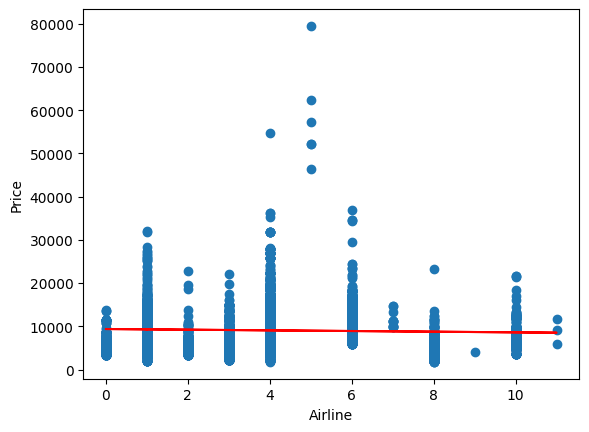

Linear regression of Source vs ticket prices:
The linear regression equation is y = 8890.20224167801 + 89.97121063334218*x
R2 is 0.0005293500923065908 
The mean squared error (MSE) is 20855562.522662062
The root mean squared error (RMSE) is 4566.789082349004



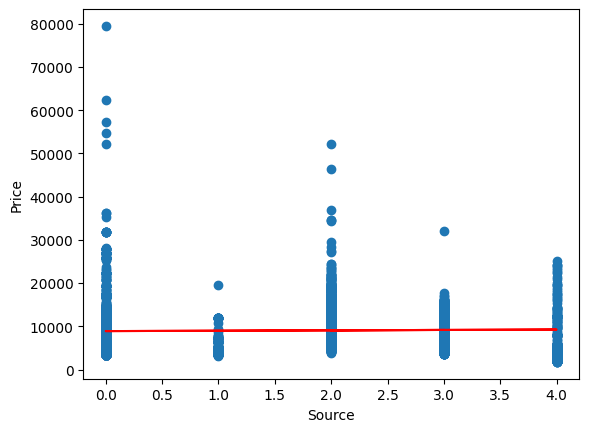

Linear regression of Destination vs ticket prices:
The linear regression equation is y = 9442.676211553957 - 267.02986747484755*x
R2 is 0.007131254291452671 
The mean squared error (MSE) is 20717803.173944186
The root mean squared error (RMSE) is 4551.681356811369



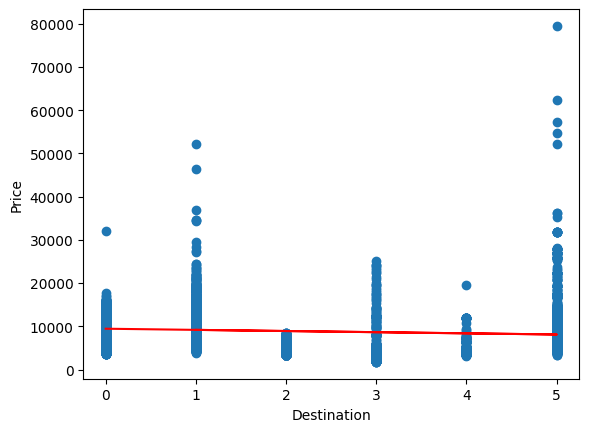

Linear regression of Route vs ticket prices:
The linear regression equation is y = 7387.976939990491 + 22.278034505706014*x
R2 is 0.03147340231311346 
The mean squared error (MSE) is 20209865.10687986
The root mean squared error (RMSE) is 4495.538355623257



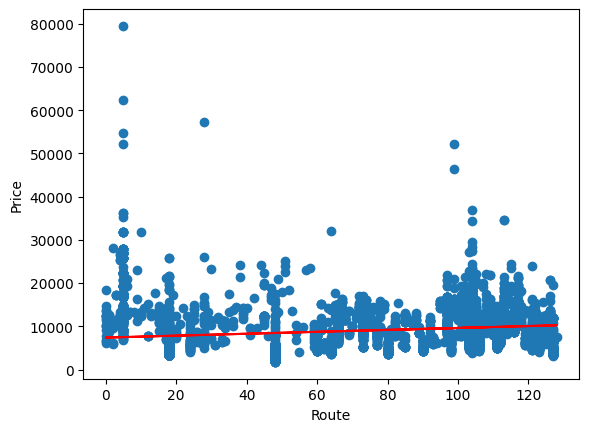

Linear regression of Total_Stops vs ticket prices:
The linear regression equation is y = 11201.794685921008 - 1455.1471111347444*x
R2 is 0.3320705452323065 
The mean squared error (MSE) is 13937422.280405864
The root mean squared error (RMSE) is 3733.285721774569



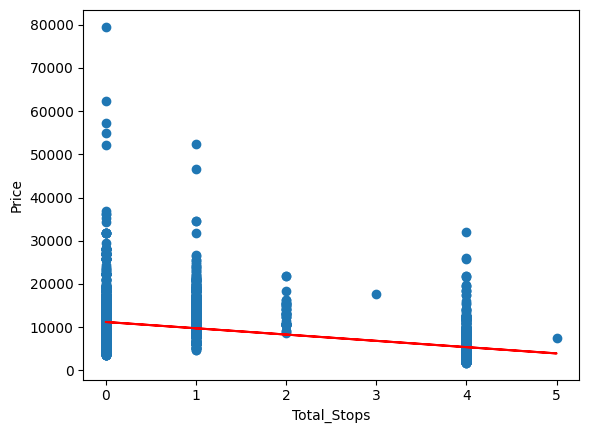

Linear regression of Additional_Info vs ticket prices:
The linear regression equation is y = 10999.71234775959 - 261.19747154243106*x
R2 is 0.004788302257952237 
The mean squared error (MSE) is 20766692.636207815
The root mean squared error (RMSE) is 4557.048676084974



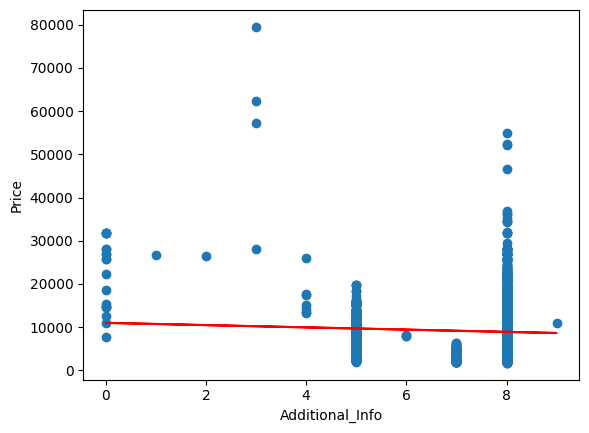

Linear regression of DT_Arrival_Time vs ticket prices:
The linear regression equation is y = 304676.43880509946 - 1.8984345697533145e-13*x
R2 is 0.016910522518008286 
The mean squared error (MSE) is 20513743.01475527
The root mean squared error (RMSE) is 4529.209976889488



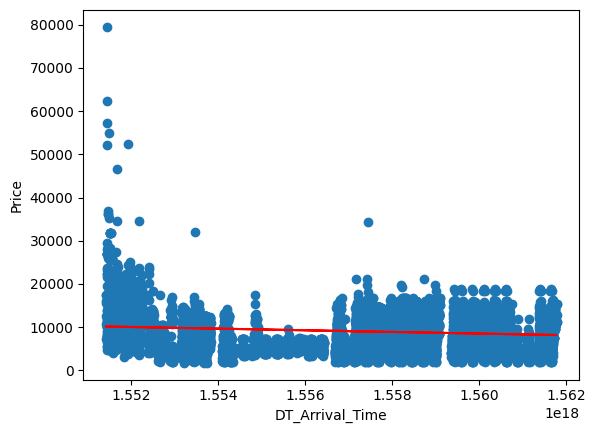

Linear regression of DT_Departure_Time vs ticket prices:
The linear regression equation is y = 315912.0802042857 - 1.9706413123480332e-13*x
R2 is 0.018237127113896467 
The mean squared error (MSE) is 20486061.276332084
The root mean squared error (RMSE) is 4526.153032800823



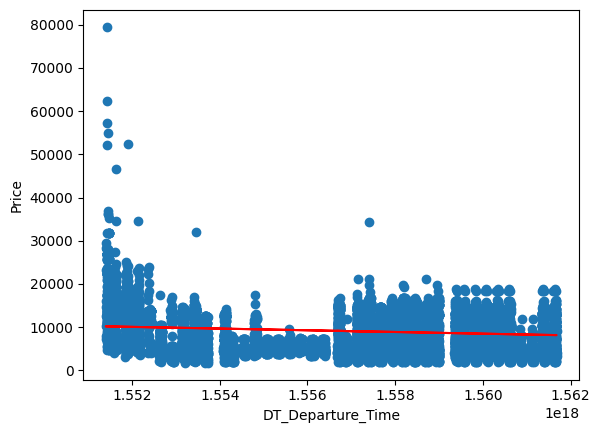

Linear regression of DT_Duration vs ticket prices:
The linear regression equation is y = 6884.835981837688 + 5.4988301394509276e-11*x
R2 is 0.19069842224696665 
The mean squared error (MSE) is 16887378.99014469
The root mean squared error (RMSE) is 4109.425627766573



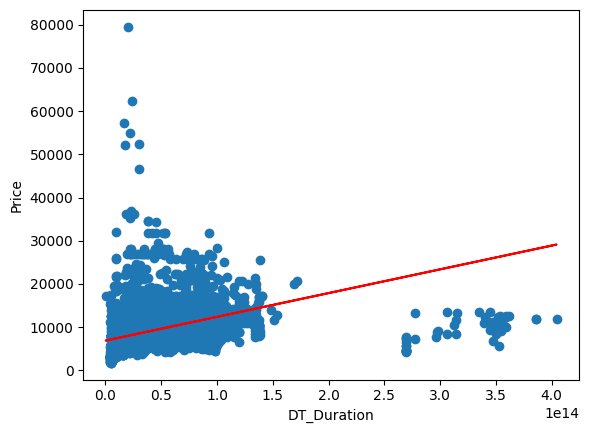

In [34]:
for x in df_le.drop('Price', axis=1).columns.tolist():
    print('Linear regression of {} vs ticket prices:'.format(x))
    x, x_label = df_le[[x]].values, list(df_le[[x]].columns)
    y, y_label = df_le['Price'].values, list(df_le[['Price']].columns)

    linear_regression_model(x, y, x_label[0], y_label[0])


It is clear that single linear regression is not really a viable option to describe the data and/or deduce any outcomes.

## Multilinear Regression

In [35]:
def mlinear_regression_model(x, y, x_label, y_label):
    """"This function takes in x and y in a numpy array form, and returns the
    linear regression equation, R2, MSE, and RMSE. It also graphs the whole
    thing.

    This function only works with either 2 x variables or 3. In the case of 3 x
    variables there will be no graph.
    """
    model = linear_model.LinearRegression().fit(x, y)

    # Get the intercept (a_0) and coefficients (a_1 / a_2)
    a_0 = model.intercept_
    a_1 = model.coef_[0]
    a_2 = model.coef_[1]

    if len(x_label) == 3:
        a_3 = model.coef_[2]
    else:
        a_3 = None

    # Scoring the prediction accuracy
    y_pred = model.predict(x)

    # R2, MSE and RMSE
    r_score = metrics.r2_score(y, y_pred)
    MSE = metrics.mean_squared_error(y, y_pred)
    RMSE = np.sqrt(metrics.mean_squared_error(y, y_pred))

    if len(x_label) == 2:
        print('The linear regression equation is y = {} + {}*x_1 + {}*x_2'.format(a_0, a_1, a_2))
    else:
        print('The linear regression equation is y = {} + {}*x_1 + {}*x_2 + {}*x_3'.format(a_0, a_1, a_2, a_3))
    print('R2 is {} '.format(r_score))
    print('The mean squared error (MSE) is {}'.format(MSE))
    print('The root mean squared error (RMSE) is {}'.format(RMSE))
    print()

    if len(x_label) == 2:
        # Graph
        fig = plt.figure(figsize=(8, 6), dpi=100).add_subplot(projection='3d')
        # mpl.rcParams['legend.fontsize'] = 12

        # ax = fig.gca()

        fig.view_init(45, 45)

        fig.scatter(x[:, 0], x[:, 1], y)
        fig.plot(x[:, 0], x[:, 1], y_pred, c='y')
        fig.set_xlabel(x_label[0])
        fig.set_ylabel(x_label[1])
        fig.set_zlabel(y_label[0])
        # ax.legend()
        plt.show()
    else:
        return


In [36]:
df_le.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops',
       'Additional_Info', 'Price', 'DT_Arrival_Time', 'DT_Departure_Time',
       'DT_Duration'],
      dtype='object')

The linear regression equation is y = 7715.5480634373 + -84.78875821009096*x_1 + 22.399320123526792*x_2
R2 is 0.03338512649398184 
The mean squared error (MSE) is 20169973.907289486
The root mean squared error (RMSE) is 4491.099409642308



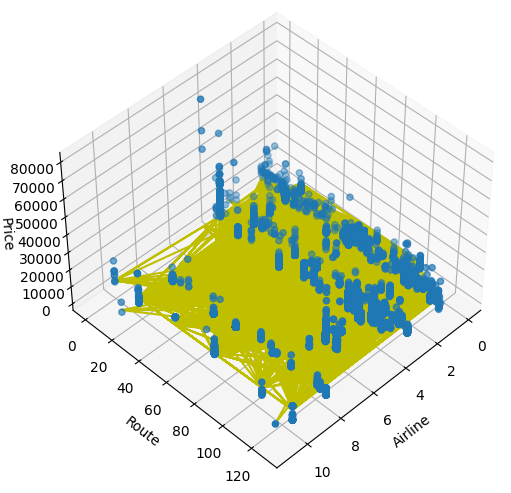

The linear regression equation is y = 9847.653315889776 + -154.06889024986188*x_1 + -339.4542115822804*x_2
R2 is 0.008158934547349284 
The mean squared error (MSE) is 20696358.972624082
The root mean squared error (RMSE) is 4549.325111774721



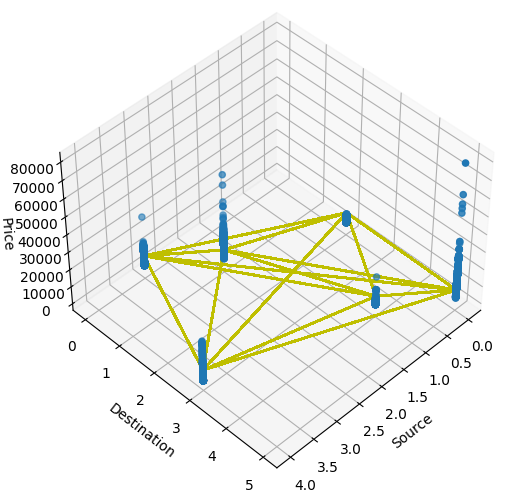

The linear regression equation is y = 11413.541305609448 + -85.53518805217092*x_1 + -271.219907264394*x_2
R2 is 0.006727733287115734 
The mean squared error (MSE) is 20726223.28866785
The root mean squared error (RMSE) is 4552.606208389635



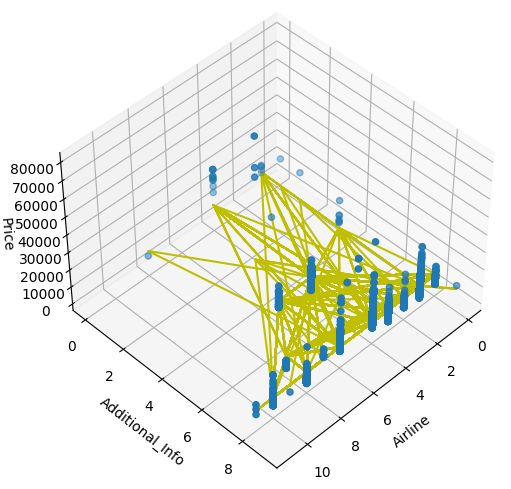

The linear regression equation is y = 6675.786172132352 + 48.065133341521076*x_1 + 5.544620550049743e-11*x_2
R2 is 0.191299838514977 
The mean squared error (MSE) is 16874829.472476717
The root mean squared error (RMSE) is 4107.898425287159



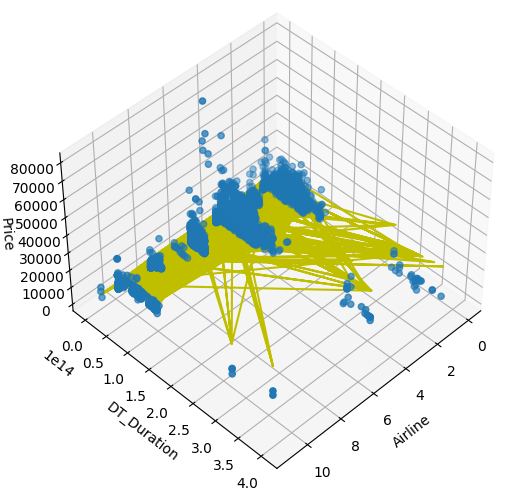

In [37]:
# Set x & y values
pairs = [['Airline', 'Route'], ['Source', 'Destination'], ['Airline', 'Additional_Info'], ['Airline', 'DT_Duration']]

for pair in pairs:
    x, x_label = df_le[pair].values, list(df_le[pair].columns)
    y, y_label = df_le['Price'].values, list(df_le[['Price']].columns)
    
    mlinear_regression_model(x, y, x_label, y_label)


It is clear as well that multilinear regression may not really be a viable option to describe the data and/or deduce any outcomes.

## Polynomial Regression

In [38]:
def polynomial_regression_model(x, y, x_label, y_label, deg):
    """"This function takes in x and y in numpy array forms, and returns the
    polynomial regression equation, R2, MSE, and RMSE. This function works with 
    just one x variable.
    """
    # Create the polynomial regression model
    poly_reg = PolynomialFeatures(degree=deg)
    x_poly = poly_reg.fit_transform(x)

    # Create the linear regression model and fit x and y
    lin = linear_model.LinearRegression()
    lin.fit(x, y)

    # Create the linear regression model and fit x_poly and y
    lin2 = linear_model.LinearRegression()
    lin2.fit(x_poly, y)

    fig, axes = plt.subplots(1, 2, figsize=(20, 6))  # plot 2 graphs
    # Visualising the Linear Regression results
    axes[0].scatter(x, y, color='blue')
    axes[0].plot(x, lin.predict(x), color='red')
    axes[0].set_title('Linear Regression')

    # Visualising the Polynomial Regression results
    axes[1].scatter(x, y, color='blue')
    axes[1].plot(x, lin2.predict(poly_reg.fit_transform(x)), color='red')
    axes[1].set_title('Polynomial Regression')

    # Set the labels
    for ax in axes.flat:
        ax.set(xlabel=x_label, ylabel=y_label)

    plt.show()

In [39]:
df_le.columns

Index(['Airline', 'Source', 'Destination', 'Route', 'Total_Stops',
       'Additional_Info', 'Price', 'DT_Arrival_Time', 'DT_Departure_Time',
       'DT_Duration'],
      dtype='object')

Airline:


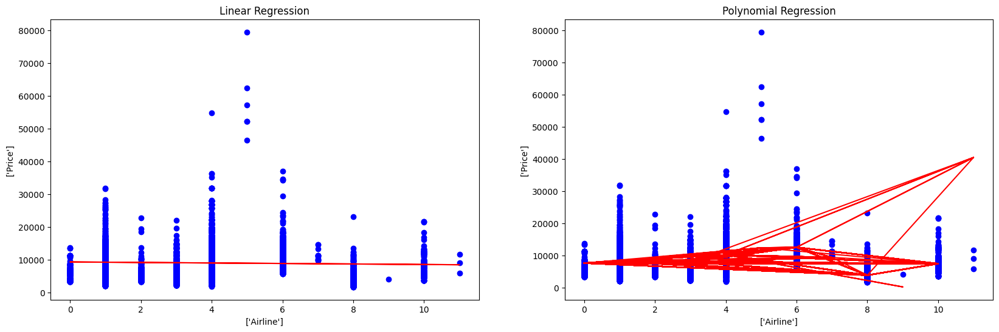

Source:


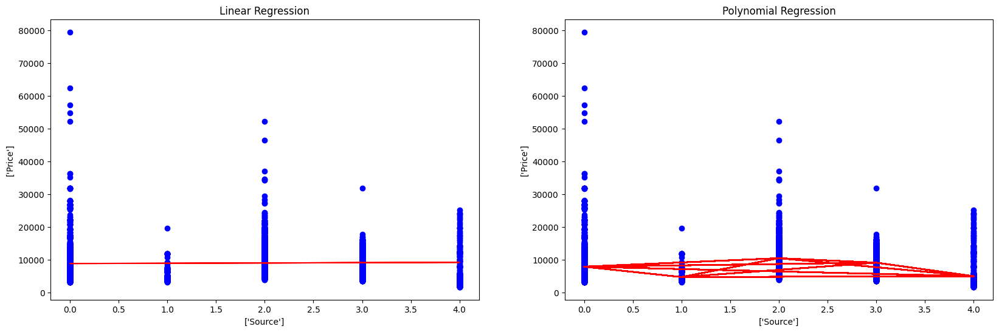

Destination:


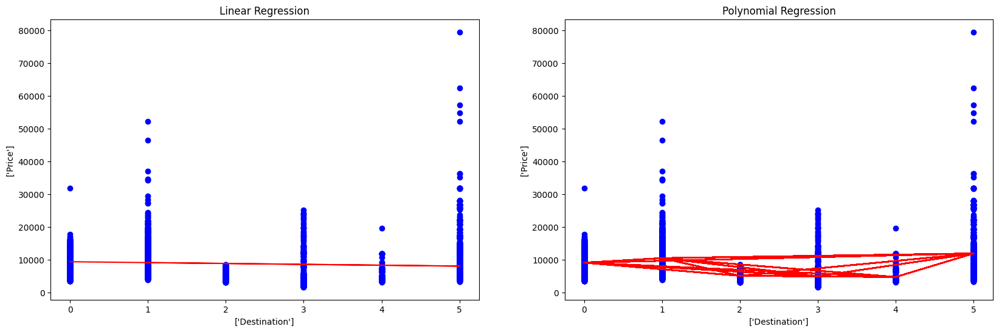

Route:


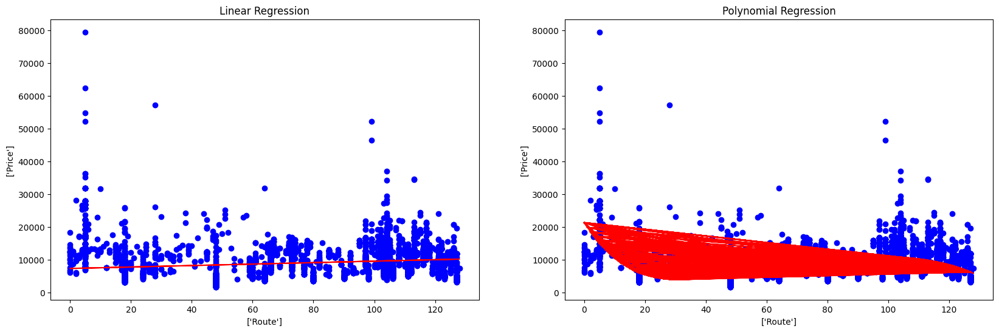

Total_Stops:


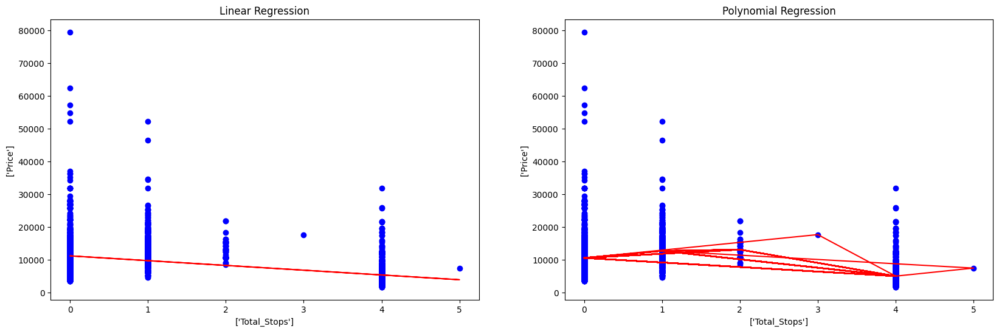

Additional_Info:


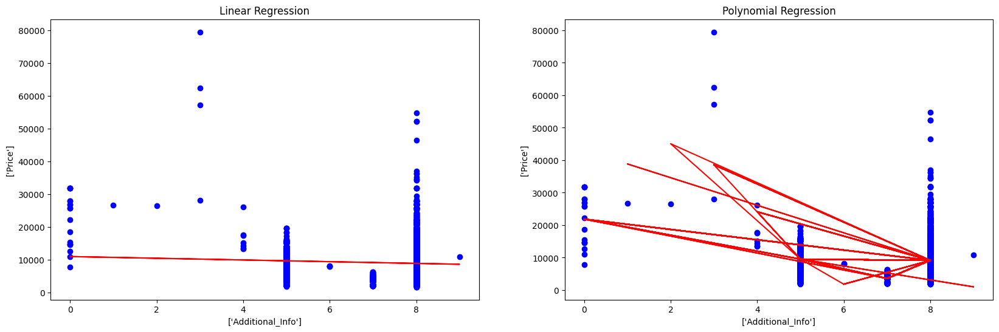

DT_Arrival_Time:


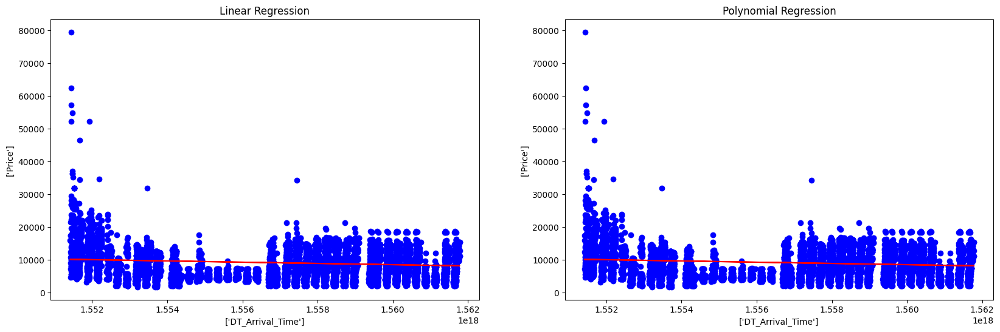

DT_Departure_Time:


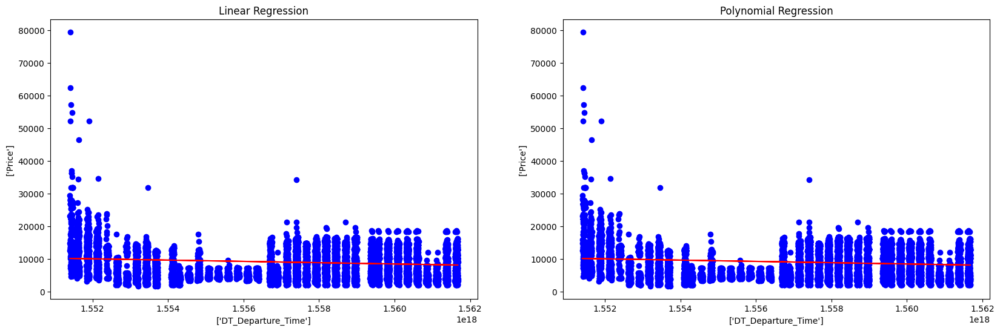

DT_Duration:


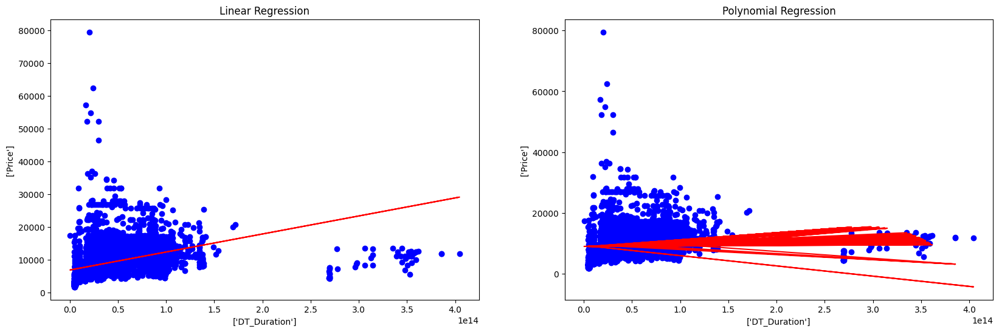

In [40]:
# Set x & y values
for xdata in ['Airline', 'Source', 'Destination', 'Route', 'Total_Stops', 'Additional_Info', 'DT_Arrival_Time', 'DT_Departure_Time', 'DT_Duration']:
    print('{}:'.format(xdata))
    x, x_label = df_le[[xdata]].values, list(df_le[[xdata]].columns)
    y, y_label = df_le['Price'].values, list(df_le[['Price']].columns)

    polynomial_regression_model(x, y, x_label, y_label, 5)


## Regularization

In [41]:
class RegressionModel():
    def __init__(self, df, ts=0.3, rs=1):
        print('Loading dataframe...')
        self.df = df
        self.x = self.df.drop(
            ['Price'], axis=1)
        self.y = self.df['Price']

        print('Train/Test splitting...')
        self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(
            self.x, self.y, test_size=ts, random_state=rs)
        print('Creating simple linear regression model...')
        self.reg = linear_model.LinearRegression()
        print('Creating L1 regularized linear regression model (Lasso)...')
        self.lasso_reg = linear_model.Lasso(alpha=50, max_iter=500, tol=0.1)
        print('Creating L2 regularized linear regression model (Ridge)...')
        self.ridge_reg = linear_model.Ridge(alpha=50, max_iter=500, tol=0.1)

        print('All three regression models created successfully!')
        print('------------')
        self.fit()
    
    def fit(self):
        print('Fitting the simple linear regression model (R1)...')
        # using .values to suppress warnings
        self.reg.fit(self.x_train.values, self.y_train.values)
        print('Fitting the L1 regularized linear regression model (R2)...')
        self.lasso_reg.fit(self.x_train.values, self.y_train.values)
        print('Fitting the L2 regularized linear regression model (R3)...')
        self.ridge_reg.fit(self.x_train.values, self.y_train.values)

        print('All three models (R1/R2/R3) fitted successfully!')
        print('------------')

    def predict(self, x):
        x = np.array(x).reshape(1, -1)
        reg_pred = self.reg.predict(x)
        lasso_reg_pred = self.lasso_reg.predict(x)
        ridge_reg_pred = self.ridge_reg.predict(x)
        avg_pred = (reg_pred + lasso_reg_pred + ridge_reg_pred) / 3
        print('Using R1, y is predicted to be: {}'.format(str(reg_pred)))
        print('Using R2, y is predicted to be: {}'.format(str(lasso_reg_pred)))
        print('Using R3, y is predicted to be: {}'.format(str(ridge_reg_pred)))
        print('------------')
        print('The average prediction would be: {}'.format(str(avg_pred)))
        print('------------')

    def score(self):
        reg_score = self.reg.score(self.x_test.values, self.y_test.values)
        lasso_reg_score = self.lasso_reg.score(
            self.x_test.values, self.y_test.values)
        ridge_reg_score = self.ridge_reg.score(
            self.x_test.values, self.y_test.values)

        print('R1\'s score is: {}'.format(str(reg_score)))
        print('R2\'s score is: {}'.format(str(lasso_reg_score)))
        print('R3\'s score is: {}'.format(str(ridge_reg_score)))
        print('------------')

    def get_bias_var(self):
        models = {'R1': self.reg, 'R2': self.lasso_reg, 'R3': self.ridge_reg}

        for m in models:
            avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
                models[m], self.x_train.values, self.y_train.values, self.x_test.values, self.y_test.values, loss='mse', num_rounds=5, random_seed=45)
            print('For regression model {}:'.format(m))
            print('++ Average Expected Loss: {}'.format(str(avg_expected_loss)))
            print('++ Average Bias: {}'.format(str(avg_bias)))
            print('++ Average Variance: {}'.format(str(avg_var)))
            print('------------')

    def __str__(self):
        models = {'R1': self.reg, 'R2': self.lasso_reg, 'R3': self.ridge_reg}

        formula = ''
        for m in models:
            formula += 'The linear regression formula for {} is as follows:\n'.format(
                m)
            formula += 'y = '
            formula += str(models[m].intercept_)
            for idx, coef in enumerate(models[m].coef_):
                if coef == 0.0:
                    continue
                if str(coef).startswith('-'):
                    formula += ' - '
                    coef = abs(coef)
                else:
                    formula += ' + '
                formula += '{}(x{})'.format(str(coef), str(idx + 1))
            formula += '\n\n'

            # print('{}:'.format(m))
            # print(formula)
        return formula


In [42]:
reg_model = RegressionModel(df_le)

Loading dataframe...
Train/Test splitting...
Creating simple linear regression model...
Creating L1 regularized linear regression model (Lasso)...
Creating L2 regularized linear regression model (Ridge)...
All three regression models created successfully!
------------
Fitting the simple linear regression model (R1)...
Fitting the L1 regularized linear regression model (R2)...
Fitting the L2 regularized linear regression model (R3)...
All three models (R1/R2/R3) fitted successfully!
------------


/Users/sergani/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=2.92572e-32): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [43]:
# reg_model.predict([2011.15, 23, 2500, 4, 24.98745, 121.52235])

In [44]:
reg_model.score()

R1's score is: 0.37768556858966273
R2's score is: 0.37671496515413716
R3's score is: 0.3766869743309944
------------


In [45]:
reg_model.get_bias_var()

For regression model R1:
++ Average Expected Loss: 12507552.684121031
++ Average Bias: 12454615.064807937
++ Average Variance: 52937.61931309361
------------
For regression model R2:
++ Average Expected Loss: 12461385.244461361
++ Average Bias: 12446032.60087149
++ Average Variance: 15352.643589872365
------------
For regression model R3:
++ Average Expected Loss: 12494202.711116273
++ Average Bias: 12470614.010689637
++ Average Variance: 23588.700426635158
------------


/Users/sergani/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=2.9326e-32): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/Users/sergani/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.02995e-32): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [46]:
print(reg_model)

The linear regression formula for R1 is as follows:
y = 188019.51291233453 + 14.558531103376875(x1) - 406.0978783939773(x2) - 32.57016492148866(x3) - 2.847084495676809(x4) - 1313.619661126419(x5) + 16.8499405388231(x6) - 7.22153880587939e-05(x7) + 7.221538794510707e-05(x8) + 7.221541284607724e-05(x9)

The linear regression formula for R2 is as follows:
y = 257904.6133198394 + 3.8168459809452364(x1) - 256.8177962683992(x2) + 115.86483838535763(x3) - 4.532253050884406(x4) - 1347.404599864842(x5) + 28.365241841611567(x6) - 1.556464315273353e-13(x7) - 3.1649038601652497e-15(x8) + 2.5196755165577676e-11(x9)

The linear regression formula for R3 is as follows:
y = 384829.51144224557 + 14.505331757655593(x1) - 262.3334378148643(x2) + 116.05022534626389(x3) - 3.89396713002691(x4) - 1356.2033316822801(x5) + 51.95564293353141(x6) + 0.0001321149040561424(x7) - 0.00013211490429661796(x8) - 0.00013211487922691202(x9)




## Decision Tree Regression

In [49]:
# prepare the train and test data
x = df_le.drop(['Price'], axis=1)
y = df_le['Price']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [50]:
dtregressor = DecisionTreeRegressor()

dtregressor.fit(x_train, y_train)

DecisionTreeRegressor()

### Text visualization of the DT Regressor

In [51]:
columns = x.columns.tolist()

print(tree.export_text(dtregressor, feature_names=columns, show_weights=True))

|--- DT_Duration <= 19650000715776.00
|   |--- DT_Arrival_Time <= 1551894004713390080.00
|   |   |--- Route <= 11.50
|   |   |   |--- Route <= 2.50
|   |   |   |   |--- value: [11873.00]
|   |   |   |--- Route >  2.50
|   |   |   |   |--- DT_Departure_Time <= 1551446228602978304.00
|   |   |   |   |   |--- value: [26890.00]
|   |   |   |   |--- DT_Departure_Time >  1551446228602978304.00
|   |   |   |   |   |--- DT_Departure_Time <= 1551662282637836288.00
|   |   |   |   |   |   |--- value: [22153.00]
|   |   |   |   |   |--- DT_Departure_Time >  1551662282637836288.00
|   |   |   |   |   |   |--- value: [22270.00]
|   |   |--- Route >  11.50
|   |   |   |--- Route <= 47.50
|   |   |   |   |--- DT_Departure_Time <= 1551480725780299776.00
|   |   |   |   |   |--- DT_Duration <= 10050000125952.00
|   |   |   |   |   |   |--- DT_Departure_Time <= 1551422108066643968.00
|   |   |   |   |   |   |   |--- value: [15676.00]
|   |   |   |   |   |   |--- DT_Departure_Time >  1551422108066643968.

### Graph Visualization of Decision Tree

In [52]:
tree_fig = tree.export_graphviz(dtregressor, feature_names=columns, filled=True)
graph = graphviz.Source(tree_fig, format='png')
graph

### Feature Importance

([<matplotlib.axis.YTick at 0x14bfab790>,
 [Text(0, 0, 'Source'),
  Text(0, 1, 'Destination'),
  Text(0, 2, 'Total_Stops'),
  Text(0, 3, 'DT_Departure_Time'),
  Text(0, 4, 'Route'),
  Text(0, 5, 'Additional_Info'),
  Text(0, 6, 'Airline'),
  Text(0, 7, 'DT_Arrival_Time'),
  Text(0, 8, 'DT_Duration')])

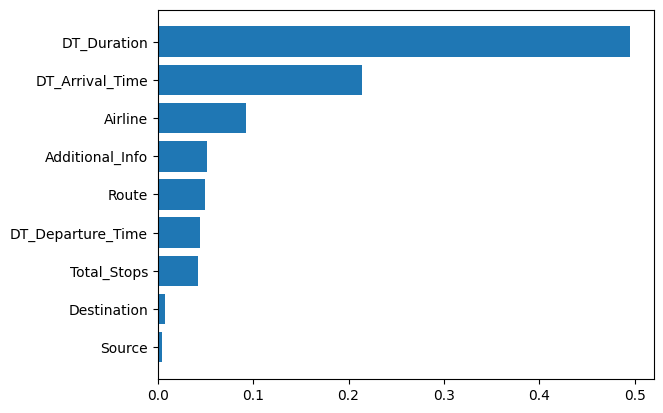

In [53]:
importance = dtregressor.feature_importances_

indicies = np.argsort(importance)

plt.barh(range(len(indicies)), importance[indicies])
plt.yticks(range(len(indicies)), [columns[i] for i in indicies])


### Performance Evaluation

In [54]:
# predict new y's
y_pred = dtregressor.predict(x_test)

In [55]:
mae = metrics.mean_absolute_error(y_test, y_pred)
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
r2_score = metrics.r2_score(y_test, y_pred)

print('MAE\t\t=', mae)
print('MSE\t\t=', mse)
print('RMSE\t\t=', rmse)
print('MAPE\t\t=', mape)  # value is under 10% which is very good
print('R2 Score\t=', r2_score)

MAE		= 840.7584858886346
MSE		= 4715141.030209128
RMSE		= 2171.4375492307227
MAPE		= 0.09665315739889604
R2 Score	= 0.7865370444327082


## Random Forest Regression

In [57]:
x = df_le.drop(['Price'], axis=1)
y = df_le['Price']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)


In [58]:
rfregressor = RandomForestRegressor()
rfregressor.fit(x_train, y_train)

RandomForestRegressor()

### Graph Visualisation

In [59]:
columns = x_train.columns.tolist()
for tree_in_forest in rfregressor.estimators_:
    tree_fig = tree.export_graphviz(tree_in_forest, feature_names=columns, filled=True)
    graph = graphviz.Source(tree_fig, format='pdf')
    graph

graph.render('Trees', format='pdf', view=True)

'Trees.pdf'

### Feature Importance

([<matplotlib.axis.YTick at 0x14c0544c0>,
 [Text(0, 0, 'Destination'),
  Text(0, 1, 'Source'),
  Text(0, 2, 'Total_Stops'),
  Text(0, 3, 'Additional_Info'),
  Text(0, 4, 'Route'),
  Text(0, 5, 'DT_Departure_Time'),
  Text(0, 6, 'Airline'),
  Text(0, 7, 'DT_Arrival_Time'),
  Text(0, 8, 'DT_Duration')])

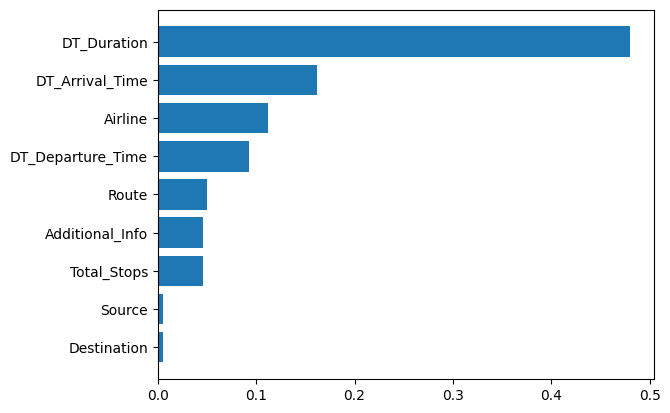

In [60]:
importance = rfregressor.feature_importances_

indicies = np.argsort(importance)

plt.barh(range(len(indicies)), importance[indicies])
plt.yticks(range(len(indicies)), [columns[i] for i in indicies])

### Performance Evaluation

In [61]:
# predict new y's
y_pred = rfregressor.predict(x_test)

In [62]:
mae = metrics.mean_absolute_error(y_test, y_pred)
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
r2_score = metrics.r2_score(y_test, y_pred)

print('MAE\t\t=', mae)
print('MSE\t\t=', mse)
print('RMSE\t\t=', rmse)
print('MAPE\t\t=', mape)  # value is under 10% which is very good
print('R2 Score\t=', r2_score)

MAE		= 716.0631441570021
MSE		= 2366465.056360253
RMSE		= 1538.331907086456
MAPE		= 0.08868004384402864
R2 Score	= 0.8815314156137051


## KFold Cross Validation

In [67]:
for n in range(5, 15):
    cv = KFold(n_splits=n, random_state=1, shuffle=True)

    score = cross_val_score(rfregressor, x, y, cv=cv,
                            scoring='neg_mean_squared_error')

    print('At {} folds, MSE = {}'.format(n, np.mean(np.absolute(score))))
    # score  # returns the score for each fold


At 5 folds, MSE = 2619233.19548453
At 6 folds, MSE = 2552172.6867082515
At 7 folds, MSE = 2583616.0100779543
At 8 folds, MSE = 2541119.9734985186
At 9 folds, MSE = 2502372.840631373
At 10 folds, MSE = 2521326.405282061
At 11 folds, MSE = 2526196.2113506417
At 12 folds, MSE = 2508862.9718026123
At 13 folds, MSE = 2477162.5328040435
At 14 folds, MSE = 2519258.4232095624


## Grid Search

In [69]:
param_ranges = {'n_estimators': [5, 6, 8, 12, 23, 51, 59],
                'max_depth': [5, 10, None],
                'min_samples_split': [2, 3, 4, 5]}

rf_model = RandomForestRegressor()
# rf_model = linear_model.LinearRegression()

g_search = GridSearchCV(estimator=rf_model, param_grid=param_ranges,
                        cv=3, verbose=1, return_train_score=True)

g_search.fit(x_train, y_train)

print('Best params:', g_search.best_params_)
print('Best score:', g_search.best_score_)


Fitting 3 folds for each of 84 candidates, totalling 252 fits
Best params: {'max_depth': None, 'min_samples_split': 4, 'n_estimators': 59}
Best score: 0.85824733924048
